# inspect diffusion model

## ! this contains internal data and projects/ wont run

In [1]:
!conda info | grep enviro

     active environment : abj
       base environment : /home/z/miniconda3  (writable)


In [2]:
import matplotlib.pyplot as plt
import torch
from denoising_diffusion_pytorch.denoising_diffusion_pytorch import *
from augment.transforms import Show, NormToRange

N = NormToRange()
S = Show()

vision/training/tensorboard.py suppresses FutureWarning: change from tensorboard==1.14 to nightly or 2.0


### Dataset

In [3]:
path = "/home/z/data/Self/Multitudes"
self_ds = Dataset(path, 128)
train_batch_size =32
self_dl = cycle(data.DataLoader(self_ds, batch_size = train_batch_size, shuffle=True, pin_memory=True))


In [4]:
model = Unet(dim = 64, dim_mults = (1, 2, 4, 8))

self = GaussianDiffusion(
    model,
    image_size = 128,
    timesteps = 1000,   # number of steps
    loss_type = 'l1'    # L1 or L2
)

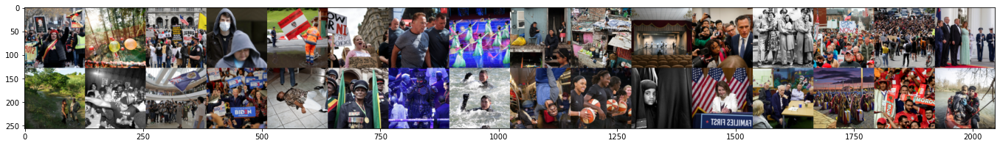

In [5]:
x = next(self_dl)
S(N(x), ncols=16)

### Noise sampling and noise blending

Uses Cosine Beta Schedule from [Improved Denoising Diffusion Probabilistic Models](https://arxiv.org/pdf/2102.09672.pdf) (17) to minimize noise changes at either end of the noise spectrum


GaussianDiffusion().forward(x, *args, **kwargs) ->
  timesteps 1000
  t: tensor([527, 861, 291, 146,  71, 982, 744, 211, 943,  83, 213, 582, 257, 441,
        689, 746, 862, 425, 223, 545,  73, 151, 816, 288, 830, 664, 538, 844,
        134, 782, 565, 474])

  GaussianDiffusion().p_losses(x, t, *args, **kwargs) ->
    noise torch.Size([32, 3, 128, 128]), [-4.788 5.022]


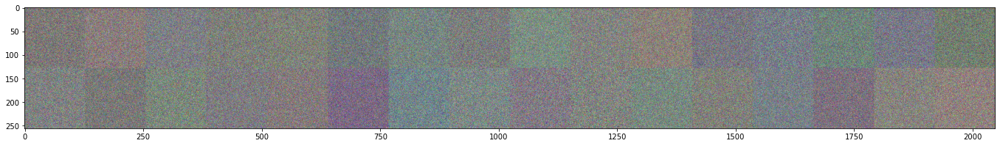

    GaussianDiffusion().q_sample(x,t) -> torch.Size([32, 3, 128, 128])


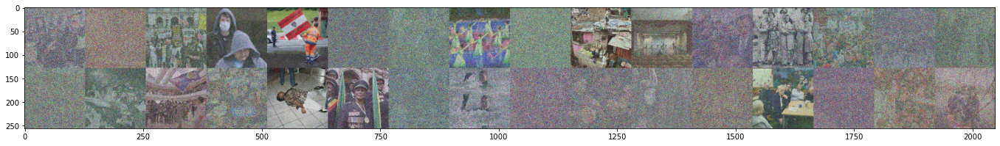

In [6]:
# GaussianDiffusion().forward(x, *args, **kwargs)
print("GaussianDiffusion().forward(x, *args, **kwargs) ->")
b, c, h, w, device, img_size, = *x.shape, x.device, self.image_size
t = torch.randint(0, self.num_timesteps, (b,), device=device).long()
print(f"  timesteps {self.num_timesteps}\n  t: {t}")

# GaussianDiffusion().p_losses(self, x_start, t, noise = None):
print('\n  GaussianDiffusion().p_losses(x, t, *args, **kwargs) ->')
noise = None
noise = default(noise, lambda: torch.randn_like(x))
print(f'    noise {noise.shape}, [{noise.min().item():.3f} {noise.max().item():.3f}]')
S(N(noise), ncols=16)

x_noisy = self.q_sample(x_start=x, t=t, noise=noise)
print(f"    GaussianDiffusion().q_sample(x,t) -> {x_noisy.shape}")
S(N(x_noisy), ncols=16)


q_sample is not exactly a lerp


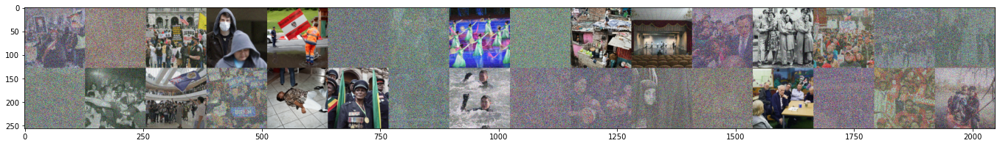

but x*sqrt(cumprod[t] + noise*sqrt(1-cumprod[t]))


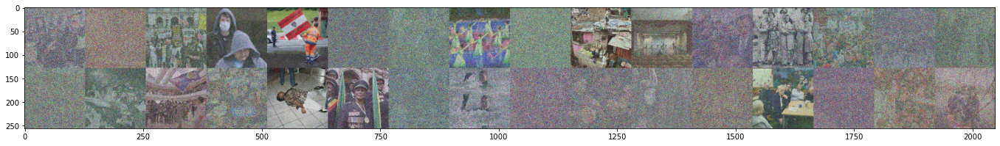

In [7]:
print("q_sample is not exactly a lerp")
S(N(torch.lerp(noise,x, self.sqrt_alphas_cumprod[t].view(len(x),1,1,1))), ncols=16)
print("but x*sqrt(cumprod[t] + noise*sqrt(1-cumprod[t]))")
q_sample = self.sqrt_alphas_cumprod[t].view(len(x), 1,1,1)*x + self.sqrt_one_minus_alphas_cumprod[t].view(len(x),1,1,1)*noise
S(N(q_sample), ncols=16)

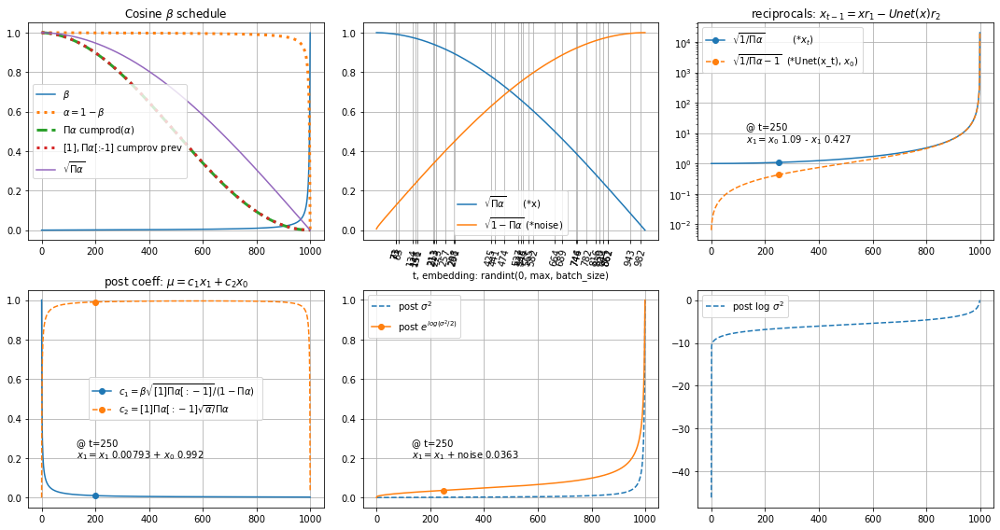

In [8]:
plt.figure(figsize=(15,8))
c=3
r=2
plt.subplot(r,c,1)
import numpy as np

betas = cosine_beta_schedule(1000)
alphas = 1 - betas
alphas_cumprod = np.cumprod(alphas, axis=0)
alphas_cumprod_prev = np.append(1., alphas_cumprod[:-1])

_example = 250


plt.title("Cosine $\\beta$ schedule")
plt.plot(betas, label="$\\beta$")
plt.plot(1-betas, label="$\\alpha = 1-\\beta$", linestyle=":", linewidth=3)
# plt.plot(alphas, label="$\\alpha = 1 - \\beta$")
plt.plot(alphas_cumprod, label="$\\Pi\\alpha$ cumprod($\\alpha$)", linestyle="--", linewidth=3)
plt.plot(alphas_cumprod_prev, label="$[1],\\Pi\\alpha$[:-1] cumprov prev", linestyle=":", linewidth=3)
plt.plot(np.sqrt(alphas_cumprod), label="$\\sqrt{\\Pi\\alpha}$")
plt.legend()
plt.grid()

plt.subplot(r,c,2)
plt.plot(self.sqrt_alphas_cumprod.clone().detach(), label="$\\sqrt{ \\Pi\\alpha}$      (*x)")
plt.plot(self.sqrt_one_minus_alphas_cumprod.clone().detach(), label="$\\sqrt{1 - \\Pi\\alpha}$ (*noise)")

# sqrt_recip_alphas_cumprod = np.sqrt(1. / alphas_cumprod)
# sqrt_recipm1_alphas_cumprod = np.sqrt(1. / alphas_cumprod - 1)
plt.xticks(sorted(t.tolist()), rotation=75)
plt.grid()
plt.legend()
plt.xlabel("t, embedding: randint(0, max, batch_size)")


plt.subplot(r,c,3)
# np.sqrt(1. / alphas_cumprod))
plt.title("reciprocals: $x_{t-1} = x r_1 - Unet(x) r_2 $")
recip_a = self.sqrt_recip_alphas_cumprod.clone().detach()
recip_1_a = self.sqrt_recipm1_alphas_cumprod.clone().detach()
plt.plot(recip_a, label="$\\sqrt{1/\\Pi \\alpha}$          (*$x_t$)",
         markevery=[_example], marker='o')
plt.plot(recip_1_a,
         label="$\\sqrt{1/\\Pi\\alpha -1}$  (*Unet(x_t), $x_0$)", linestyle="--", markevery=[_example], marker='o')
plt.text(130,5, f"@ t={_example} \n$x_1=x_0$ {recip_a[_example].item():.3} - $x_1$ {recip_1_a[_example].item():.3}")
plt.grid()
plt.legend()
plt.yscale("log")
plt.subplot(r,c,4)

plt.title("post coeff: $\mu = c_1 x_1 + c_2 x_0$")
_c1 = self.posterior_mean_coef1
_c2 = self.posterior_mean_coef2

# betas * np.sqrt(alphas_cumprod_prev) / (1. - alphas_cumprod))
plt.plot(_c1, label="$c_1 =\\beta\\sqrt{[1]\\Pi\\alpha[:-1]}/(1-\\Pi \\alpha)$  ",
         markevery=[200], marker='o')
plt.plot(_c2, label="$c_2 =[1]\\Pi\\alpha[:-1] \\sqrt{\\alpha}/\\Pi \\alpha$  ",
         markevery=[200], marker='o', linestyle="--")

plt.text(130,0.2, f"@ t={_example} \n$x_1=x_1$ {_c1[_example].item():.3} + $x_0$ {_c2[_example].item():.3}")

plt.grid()
plt.legend()


plt.subplot(r,c,5)
_logvar = torch.exp(self.posterior_log_variance_clipped/2)
plt.plot(self.posterior_variance, label="post $\\sigma^2$", linestyle="--")
plt.plot(_logvar, label="post $e^{log (\\sigma^2/2)}$",
        markevery=[_example], marker='o')

plt.text(130,0.2, f"@ t={_example} \n$x_1=x_1$ + noise {_logvar[_example].item():.3}")

plt.grid()
plt.legend()

plt.subplot(r,c,6)
plt.plot(self.posterior_log_variance_clipped, label="post log $\\sigma^2$", linestyle="--")
plt.legend()
plt.grid()

plt.tight_layout()

plt.show()

## sampling

$ x_T \sim \mathcal{N}(0,I)$

$\mathbf{for}\space t = T, ..., 1\space \mathbf{do}$

$\space\space  z \sim \mathcal{N}(0,I) \space if\space t \gt 1 \space else\space z =0$

$\space\space x_{t-1} = \frac{1}{\sqrt{\alpha_t}} (x_t - \frac{1-\alpha_t}{\sqrt{1-\bar\alpha_t}}\mathbf{z}_{\theta}(x_t,t))+\sigma_t z$

$\mathbf{end} \space \mathbf{for}$

$\mathbf{return} x_0$

where $\overline {\alpha}_t = \Pi_{s=1}^{t} \alpha_s$

$\alpha = 1 - \beta$

## code 
sqrt_recip_alphas_cumprod = $ \sqrt{\frac{1}{\overline{\alpha}_{t-1}}}$

sqrt_recipm1_alphas_cumprod =  $ \sqrt{\frac{1}{{\overline{\alpha}_{t-1}}} -1}$

posterior_mean_coef1 = $ \frac{(1-\overline{\alpha}_{t-1}) \sqrt{\overline{\alpha}_{t}}}{1- \overline{\alpha}_{t-1}}$

posterior_mean_coef2 = $ \frac{(1-\overline{\alpha}_{t})\sqrt{\alpha_{t-1}}}{1- \overline{\alpha}_{t-1}}$

posterior_log_variance_clipped = $log( \beta \frac{1 - \overline{\alpha}_{t}} {1 - \overline{\alpha}_{t-1}})$

$x_{t-1} = x_t \sqrt{\frac{1}{\overline{\alpha}_{t-1}}} - \mathbf{z}_{\theta}(x_t, t) \sqrt{\frac{1}{{\overline{\alpha}_{t-1}}} -1} $

$x_{t-1} = \frac{x_{t-1}(1-\overline{\alpha}_{t-1}) \sqrt{\overline{\alpha}_{t}} \space+\space x_t(1-\overline{\alpha}_{t})\sqrt{{\alpha}_{t-1}}}{1- \overline{\alpha}_{t-1}} $

$x_{t-1} = x_{t-1} + x e^{log( \beta \frac{1 - \overline{\alpha}_{t}} {1 - \overline{\alpha}_{t-1}})}$

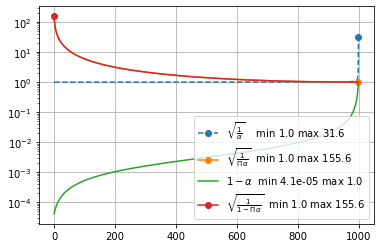

In [9]:
# betas = cosine_beta_schedule(1000)
# alphas = 1 - betas
# alphas_cumprod = np.cumprod(alphas, axis=0)
# alphas_cumprod_prev = np.append(1., alphas_cumprod[:-1])
kw = {'markevery':[999], 'marker':"o"}
_inv_sqrt_a = 1/np.sqrt(alphas)
_inv_sqrt_Pa = 1/np.sqrt(1-np.cumprod(alphas))
_inv_sqrt_1_Pa = 1/np.sqrt(1 - np.cumprod(alphas))
amax = f"    min {_inv_sqrt_a.min():.1f} max {_inv_sqrt_a.max():.1f}"
pamax = f"  min {_inv_sqrt_Pa.min():.1f} max {_inv_sqrt_Pa.max():.1f}"
ompamax = f"  min {_inv_sqrt_1_Pa.min():.1f} max {(_inv_sqrt_1_Pa).max():.1f}"
am = f"  min {(1-alphas).min():.1e} max {(1-alphas).max():.1f}"

plt.plot(_inv_sqrt_a, label="$\\sqrt{\\frac{1}{\\alpha}}$"+amax, linestyle="--", **kw)
plt.plot(_inv_sqrt_Pa, label="$\\sqrt{\\frac{1}{\\Pi\\alpha}}$"+pamax, **kw)
kw['markevery'] = [0]
plt.plot(1 - alphas, label="$1 -\\alpha$"+am)
plt.plot(1/np.sqrt(1 - np.cumprod(alphas)), label="$\\sqrt{\\frac{1}{1 -\\Pi\\alpha}}$"+ompamax, **kw)
plt.legend()
plt.grid()
plt.yscale("log")
plt.show()

In [10]:
alphas[250]

0.9986727760457882

In [49]:
# denoise_fn: UNet
x_recon = self.denoise_fn(x_noisy, t)

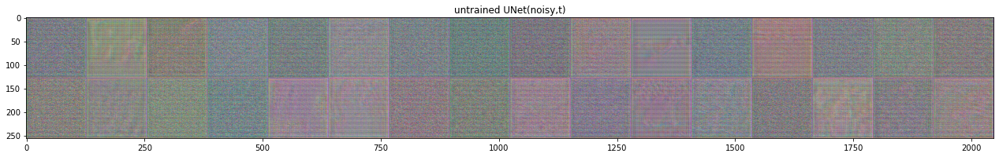

In [10]:
S(N(x_recon.clone().detach()), ncols=16, title="untrained UNet(noisy,t)")

In [11]:
loss = (noise - x_recon).abs().mean()
print(loss.clone().detach())

tensor(0.8060)


## UNet

    time_mlp: sinusoidal embedding ( dims, num_timesteps) -> tensor shape (dim, dim)
        num_timesteps: maximum dimension
        dims: len of embedding

        t = randint(0, num_timesteps, dims//2) * decay(1-0) # decay similar to PE from vaswani 2017
        t = cat ( sin(t), cos(t)) @ LL.weights (shape =(dims,dims*4)) + bias(dims) 
        t = GELU(t) @ LL.weights (shape =(dims*4,dims)) + bias (dims*4)

      -> ConvNext Blocks


In [12]:
self.denoise_fn.time_mlp

Sequential(
  (0): SinusoidalPosEmb()
  (1): Linear(in_features=64, out_features=256, bias=True)
  (2): GELU()
  (3): Linear(in_features=256, out_features=64, bias=True)
)

### ConvNext Blocks: 4 blocks with increasing channel depth

    x, shape: (batch, dim_in, h, w)
        x = ConvNext(x, t)
        x = ConvNext(x, t)
        x = LinearAttention(x)
        x = PreNorm(x) -> residual
        x = Downsample() -> x, shape: (batch, dim_out, h, w)

In [13]:
dim = 64
dim_mults = (1, 2, 4, 8)
channels = self.denoise_fn.channels
dims = [channels, *map(lambda m: dim * m, dim_mults)]
in_out = list(zip(dims[:-1], dims[1:]))
dims, in_out

([3, 64, 128, 256, 512], [(3, 64), (64, 128), (128, 256), (256, 512)])

## Position Embedding

differneces with Attention is All You Need:

    * does not alternate sin and cosine, does not create a table
    * porcesses every set of samples and passes through 2 linear layers

In [14]:
from torch import nn
class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = x[:, None] * emb[None, :]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)
        return emb

In [15]:
PosEmb = SinusoidalPosEmb(64) #64 dimensions to t
pe = PosEmb(t)

In [16]:
half_dim = PosEmb.dim // 2
emb = math.log(10000) / (half_dim - 1)
emb

0.2971077539347156

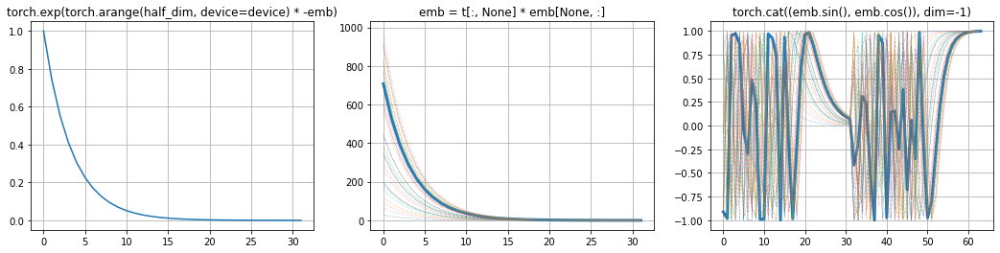

In [17]:
emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
plt.figure(figsize=(18,4))
plt.subplot(131)
plt.title("torch.exp(torch.arange(half_dim, device=device) * -emb)")

plt.plot(emb)
plt.grid()
plt.subplot(132)

emb = t[:, None] * emb[None, :]
plt.title("emb = t[:, None] * emb[None, :]")
for i, m in enumerate(emb):
    kw = {'linewidth':0.5 if i else 3, 'linestyle':":" if i else "-"}
    plt.plot(m, **kw)
plt.grid()
plt.subplot(133)
plt.title("torch.cat((emb.sin(), emb.cos()), dim=-1)")

emb = torch.cat((emb.sin(), emb.cos()), dim=-1)
for i, m in enumerate(emb):
    kw = {'linewidth':0.5 if i else 3, 'linestyle':":" if i else "-"}
    plt.plot(m, **kw)
plt.grid()
plt.show()

In [18]:
emb.shape, PosEmb.dim

(torch.Size([32, 64]), 64)

In [19]:
[p.numel() for p in PosEmb.parameters()], PosEmb.dim

([], 64)

In [20]:
t.shape, pe.shape

(torch.Size([32]), torch.Size([32, 64]))

In [21]:
print("denoise_fn: UNet().forward(x, t)")
print(f" input t {t}")
print(f" SinusoidalPosEmb(t) {self.denoise_fn.time_mlp(t).clone().detach().shape}")

denoise_fn: UNet().forward(x, t)
 input t tensor([708, 116, 382, 815, 604, 343, 758, 929, 748, 349,  27, 560, 184, 908,
        670, 647, 982, 198, 897, 706, 198,  90, 771, 595, 290, 445,  63, 334,
        823, 159, 439, 258])
 SinusoidalPosEmb(t) torch.Size([32, 64])


In [22]:
# ConvNextBlock(dim_in, dim_out, time_emb_dim = time_dim, norm = ind != 0)

In [23]:
self.denoise_fn

Unet(
  (time_mlp): Sequential(
    (0): SinusoidalPosEmb()
    (1): Linear(in_features=64, out_features=256, bias=True)
    (2): GELU()
    (3): Linear(in_features=256, out_features=64, bias=True)
  )
  (downs): ModuleList(
    (0): ModuleList(
      (0): ConvNextBlock(
        (mlp): Sequential(
          (0): GELU()
          (1): Linear(in_features=64, out_features=3, bias=True)
        )
        (ds_conv): Conv2d(3, 3, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=3)
        (net): Sequential(
          (0): Identity()
          (1): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (2): GELU()
          (3): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (res_conv): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
      )
      (1): ConvNextBlock(
        (mlp): Sequential(
          (0): GELU()
          (1): Linear(in_features=64, out_features=64, bias=True)
        )
        (ds_conv): Conv2d(64, 64, k

In [24]:
i=0
for convnext, convnext2, attn, downsample in self.denoise_fn.downs:
    print(i, "convnext, convnext2, attn, downsample")
    print(f" convnext {tuple(convnext.res_conv.weight.shape[:2])}")
    print(f" convnext2 {tuple(convnext2.ds_conv.weight.shape)[0]}")
    if hasattr(downsample, "weight"):
        print(f" downsample {tuple(downsample.weight.shape)}")
    i += 1

0 convnext, convnext2, attn, downsample
 convnext (64, 3)
 convnext2 64
 downsample (64, 64, 4, 4)
1 convnext, convnext2, attn, downsample
 convnext (128, 64)
 convnext2 128
 downsample (128, 128, 4, 4)
2 convnext, convnext2, attn, downsample
 convnext (256, 128)
 convnext2 256
 downsample (256, 256, 4, 4)
3 convnext, convnext2, attn, downsample
 convnext (512, 256)
 convnext2 512


## inference steps. after a few hours training

In [25]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import os.path as osp


In [33]:
len(inf)

132

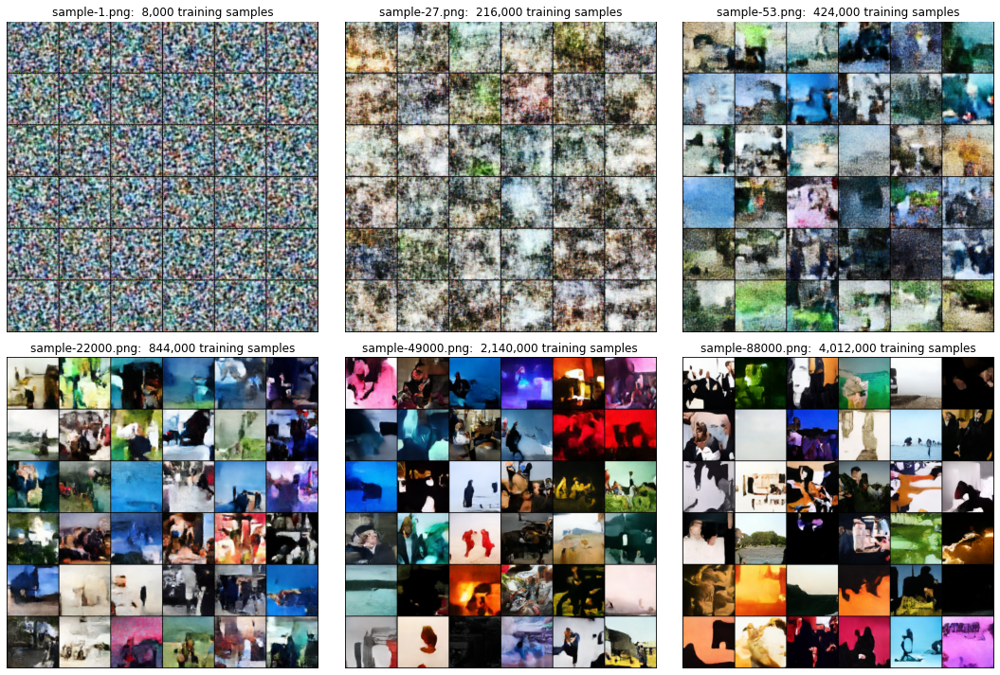

In [38]:
# trained for 53 * 250 iterations of 32 sized batches
# continued for 1000 iteration 48 sized batches 

inf = sorted([f.path for f in os.scandir("results_multitudes")
              if f.name[-4:] ==".png" and f.name[0] == 's'],
              key=lambda x: int(x.split(".")[0].split("-")[1]))
save_every=250
batch_size=32

ncols=3
nrows=2

plt.figure(figsize=(15,10))
plt.subplot(nrows, ncols, 1)
i = 0
samples = (i+1)*32*250
plt.title(f"{osp.basename(inf[0])}:  {samples:,} training samples")
plt.imshow(Image.open(inf[0]))
plt.axis("off")

plt.subplot(nrows, ncols, 2)
i=26
samples = 32*(i+1)*250
plt.title(f"{osp.basename(inf[i])}:  {samples:,} training samples")
plt.imshow(Image.open(inf[i]))
plt.axis("off")

plt.subplot(nrows, ncols, 3)
i=52
samples = 32*(i+1)*250
plt.title(f"{osp.basename(inf[i])}:  {samples:,} training samples")
plt.imshow(Image.open(inf[i]))
plt.axis("off")

save_every=1000
batch_size=48

plt.subplot(nrows, ncols, 4)
i=60
samples = lambda x: (x - 53*250)*48 + 53*250*32
iteration = int(inf[i].split(".")[0].split("-")[1])
plt.title(f"{osp.basename(inf[i])}:  {samples(iteration):,} training samples")
plt.imshow(Image.open(inf[i]))
plt.axis("off")

plt.subplot(nrows, ncols, 5)
i=90
samples = lambda x: (x - 53*250)*48 + 53*250*32
iteration = int(inf[i].split(".")[0].split("-")[1])
plt.title(f"{osp.basename(inf[i])}:  {samples(iteration):,} training samples")
plt.imshow(Image.open(inf[i]))
plt.axis("off")


plt.subplot(nrows, ncols, 6)
samples = lambda x: (x - 53*250)*48 + 53*250*32
iteration = int(inf[-1].split(".")[0].split("-")[1])
plt.title(f"{osp.basename(inf[-1])}:  {samples(iteration):,} training samples")
plt.imshow(Image.open(inf[-1]))
plt.axis("off")

plt.tight_layout()
plt.show()

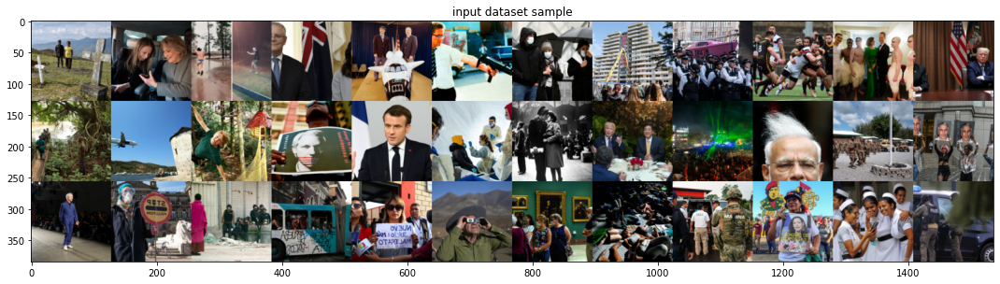

In [27]:
train_batch_size =36
self_dl = cycle(data.DataLoader(self_ds, batch_size = train_batch_size, shuffle=True, pin_memory=True))
x = next(self_dl)
S(N(x), ncols=12, title="input dataset sample", width=15)

### seeded deterministic generation across milestones

    milestones = ['last', 20000, 15000, 37, 25, 1]
    for m in milestones:
        sample(seed=0, show=False, save=True, milestone=m)


['results_multitudes/ema_sample-250_seed0.png', 'results_multitudes/ema_sample-6250_seed0.png', 'results_multitudes/ema_sample-9250_seed0.png', 'results_multitudes/ema_sample-15000_seed0.png', 'results_multitudes/ema_sample-20000_seed0.png', 'results_multitudes/ema_sample-27951_seed0.png']


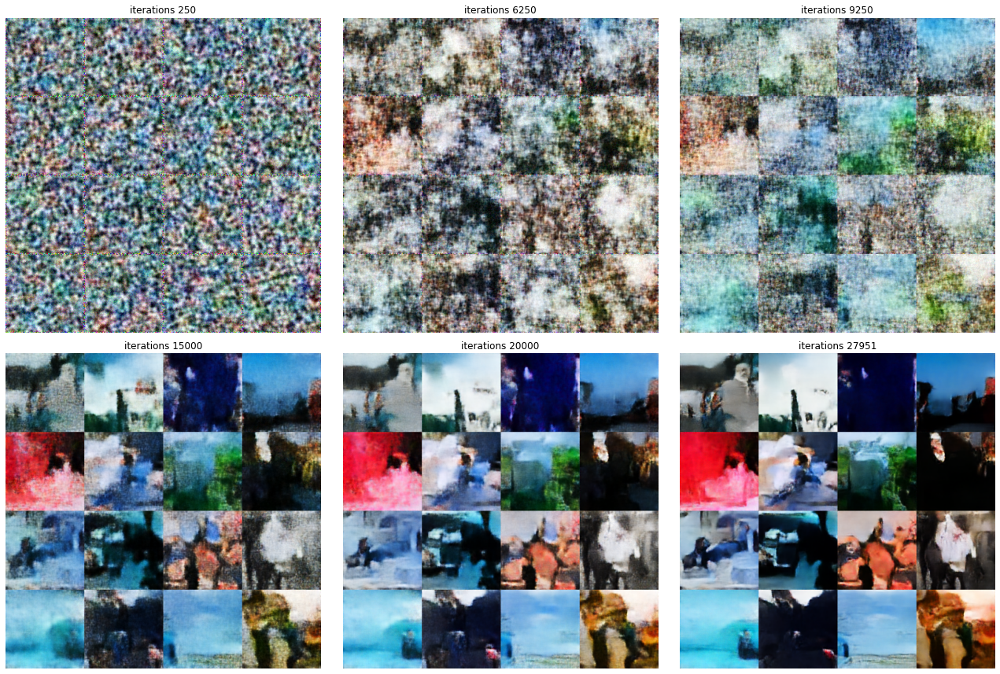

In [28]:
imgs = [f.path for f in os.scandir("results_multitudes") if f.name[-9:] =="seed0.png"]
seeded = sorted([f.path for f in os.scandir("results_multitudes")
              if f.name[-9:] =="seed0.png"],
              key=lambda x: int(x.split("_seed0")[0].split("-")[1]))
print(seeded)
ncols = 3
nrows = math.ceil(len(seeded)/ncols)
plt.figure(figsize=(18,18*nrows/ncols))
for i, img in enumerate(seeded):
    plt.subplot(nrows, ncols, 1+i)
    plt.title(f"iterations {osp.basename(img).split('_seed0')[0].split('-')[1]}")
    plt.imshow(Image.open(img))
    plt.axis("off")
plt.tight_layout()
plt.show()